# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## Utility methods

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
%matplotlib inline

def plot_images(nrows, ncols, figsize, images, axis=False, axs_titles=[], title_fontsize=30, height_limit=None, width_limit=None, cmap=None):
    if height_limit != None:
        height = height_limit
    else:
        height = img.shape[0]
        
    if width_limit != None:
        width = width_limit
    else:
        width = img.shape[1]
    
    fig, axs = plt.subplots(nrows, ncols, figsize=figsize)
    fig.subplots_adjust(hspace = .2, wspace=.05)
    axs = axs.ravel()
    
    for i, image in enumerate(images):
        if not axis:
            axs[i].axis('off')
        
        if len(axs_titles) > 0:
            axs[i].set_title(axs_titles[i], fontsize=title_fontsize)
        
        axs[i].set_xlim([0,width])
        axs[i].set_ylim([height,0])
        
        axs[i].imshow(image, cmap=cmap)
    return axs

def plot_image(image):
    plt.imshow(image)

## 1. Camera Calibration

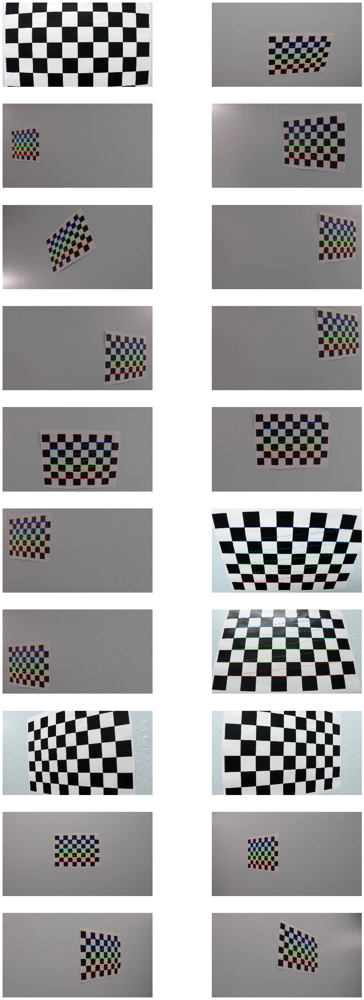

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')
calibration_output_images = []

#print(images)

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imwrite( "./calibration_output%d.jpg" % i, img )
    
    calibration_output_images.append(img)

axs = plot_images(10, 2, (20, 50), calibration_output_images)

## 2. Distorsion Correction

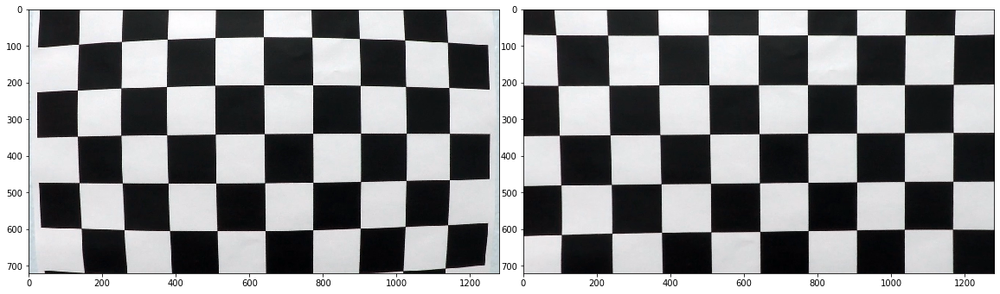

In [3]:
test_image = cv2.imread('./camera_cal/calibration1.jpg')
axs_titles = ['Original', 'Undistorted']

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, test_image.shape[0:2], None, None)
undist = cv2.undistort(test_image, mtx, dist, None, mtx)
cv2.imwrite( "./output_images/undistorted.jpg", undist )

axs = plot_images(1, 2, (20, 50), [test_image, undist], axs_titles)

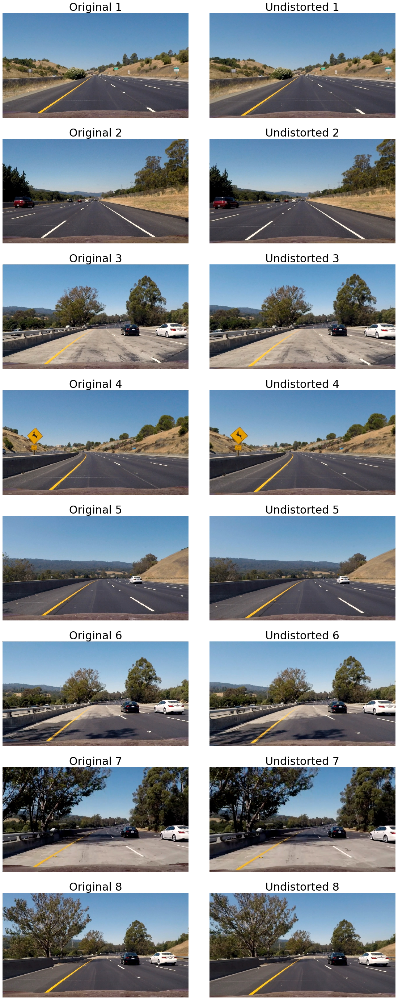

In [4]:
test_images = glob.glob('./test_images/*.jpg')
undistorted_images=[]
original_images=[]
output_test_images=[]
axs_titles=[]

for i, fname in enumerate(test_images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    output_test_images.append(img)
    original_images.append(img)
    axs_titles.append('Original %d' %int(i+1))

    undist = cv2.undistort(img, mtx, dist, None, mtx)
    undistorted_images.append(undist)
    output_test_images.append(undist)
    axs_titles.append('Undistorted %d' %int(i+1))
    

axs = plot_images(8, 2, (20, 50), output_test_images, axs_titles=axs_titles, title_fontsize=30)

## 3. Perspective Transformation

### Show original test images to select src points

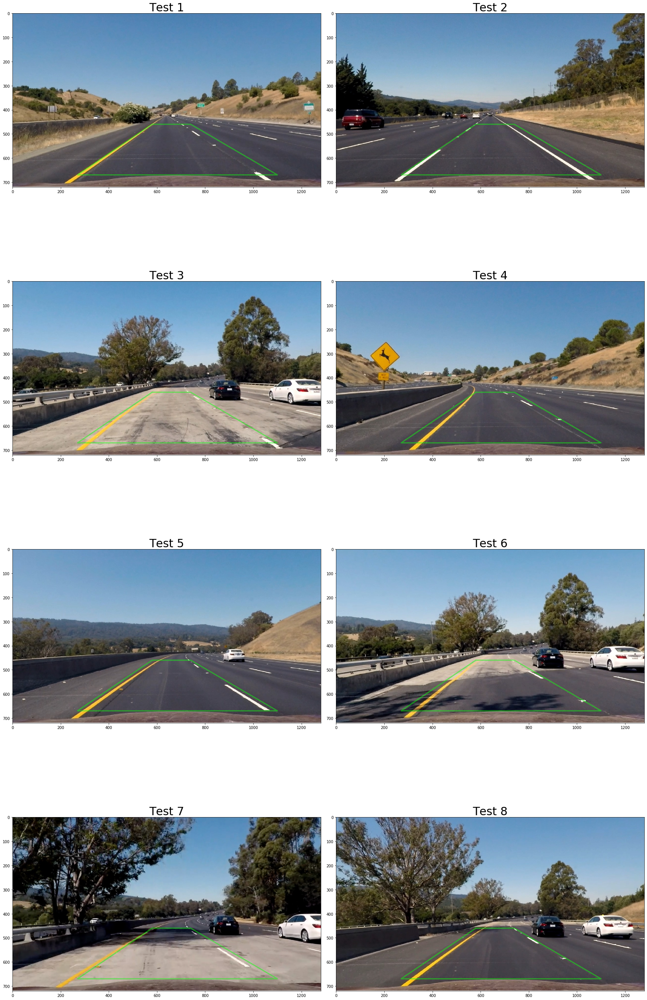

In [5]:
axs_titles = []

for i, image in enumerate(undistorted_images):
    axs_titles.append('Test %d' %int(i+1))

axs = plot_images(4, 2, (30, 50), undistorted_images, axis=True, axs_titles=axs_titles, title_fontsize=30)
x = [580.0, 740.0, 1100.0, 270.0, 580.0] # [580.0, 740.0, 1100.0, 270.0] Trapezoid lines joining points
y = [460.0, 460.0, 670.0, 670.0, 460.0] # [460.0, 460.0, 670.0, 670.0] Trapezoid lines joining points

for ax in axs:
    ax.plot(x, y, color='#10ff10', alpha=0.5, linewidth=3, solid_capstyle='round', zorder=2) # Drawing lines

In [6]:
def warp_image(img):
    height, width = img.shape[0:2]
    offset_value = 200.0
    
    #Target trapezoid points
    src = np.float32(
        [
            [580.0, 460.0],
            [740.0, 460.0],
            [1100.0, 670.0],
            [270.0, 670.0],
        ]
    )
    
    #Transformed rectangle points for the desired perspective image
    dst = np.float32(
        [
            [offset_value, 0],
            [width - offset_value, 0],
            [width - offset_value, height],
            [offset_value, height],
        ]
    )
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (width, height), flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv

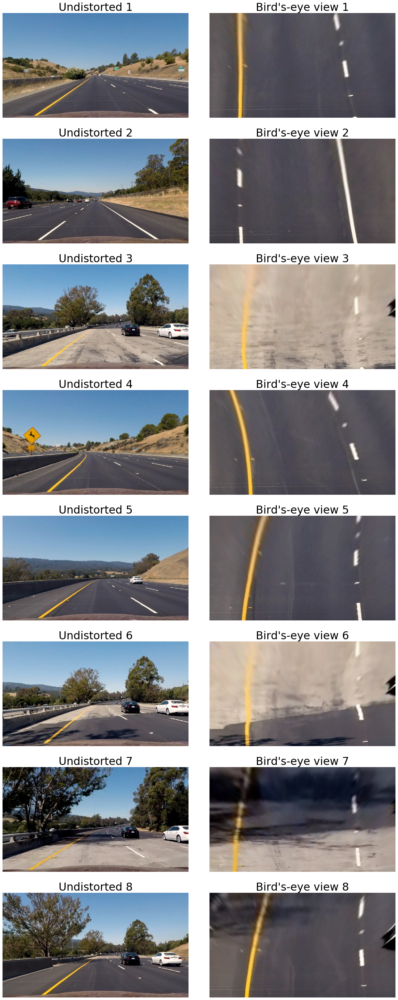

In [7]:
output_test_images = []
warped_images = []
axs_titles = []
Minvs = []

for i, undist in enumerate(undistorted_images):
    output_test_images.append(undist)
    axs_titles.append('Undistorted %d' %int(i+1))
    
    warped_image, M, Minv = warp_image(undist)
    Minvs.append(Minv)
    warped_images.append(warped_image)
    output_test_images.append(warped_image)
    axs_titles.append("Bird's-eye view %d" %int(i+1))

axs = plot_images(8, 2, (20, 50), output_test_images, axs_titles=axs_titles, title_fontsize=30)

## 4. Color/Gradient Threshold

### Visualizing in different color spaces

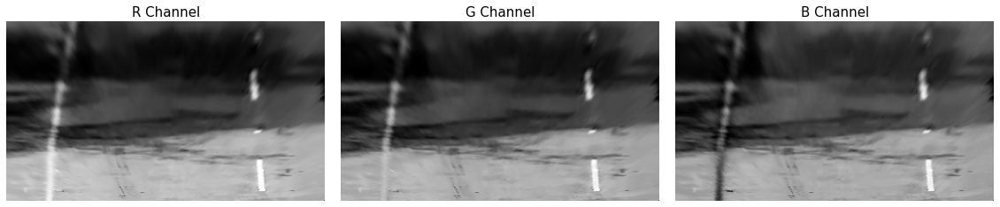

In [8]:
output_test_images = []
axs_titles = []

warped_image = warped_images[6]

# RGB
R = warped_image[:,:,0]
G = warped_image[:,:,1]
B = warped_image[:,:,2]

thresh = (180, 255)
axs_titles.append('R Channel')
output_test_images.append(R)
binary = np.zeros_like(R)

axs_titles.append('G Channel')
output_test_images.append(G)
binary = np.zeros_like(G)

axs_titles.append('B Channel')
output_test_images.append(B)
binary = np.zeros_like(B)

axs = plot_images(1, 3, (20, 50), output_test_images, axs_titles=axs_titles, title_fontsize=15, height_limit=undistorted_images[0].shape[0], width_limit=undistorted_images[0].shape[1], cmap='gray')

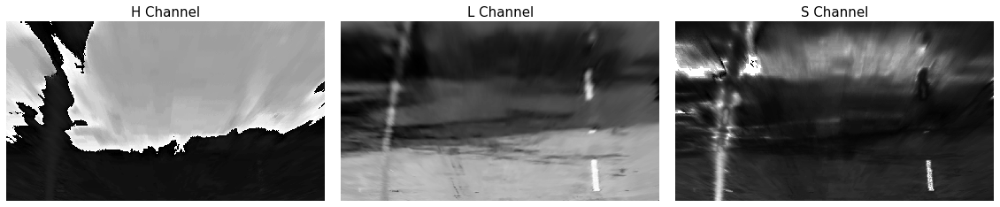

In [9]:
# HLS
output_test_images = []
axs_titles = []

warped_image = warped_images[6]
hls_image = cv2.cvtColor(warped_image, cv2.COLOR_RGB2HLS)

H = hls_image[:,:,0]
L = hls_image[:,:,1]
S = hls_image[:,:,2]

axs_titles.append('H Channel')
output_test_images.append(H)

axs_titles.append('L Channel')
output_test_images.append(L)

axs_titles.append('S Channel')
output_test_images.append(S)

axs = plot_images(1, 3, (20, 50), output_test_images, axs_titles=axs_titles, title_fontsize=15, height_limit=undistorted_images[0].shape[0], width_limit=undistorted_images[0].shape[1], cmap='gray')

### Applying Sobel, Magnitude and Direction Threshold

In [10]:
def abs_sobel_thresh(img, orient='x', thresh=(0, 255), sobel_kernel=3):
    thresh_min, thresh_max = thresh
    s_thresh = (120, 255)
    l_thresh = (30, 255)
    
    hls_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

    H = hls_image[:,:,0]
    L = hls_image[:,:,1]
    S = hls_image[:,:,2]
    
    if orient == 'x':
        sobel = cv2.Sobel(L, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(L, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    l_sobel = np.zeros_like(scaled_sobel)
    l_sobel[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    s_binary = np.zeros_like(S)
    s_binary[(S >= s_thresh[0]) & (S <= s_thresh[1])] = 1
    
    l_binary = np.zeros_like(L)
    l_binary[(L >= l_thresh[0]) & (L <= l_thresh[1])] = 1
    
    binary_output = np.zeros_like(l_sobel)
    binary_output[((l_binary == 1) & (s_binary == 1) | (l_sobel==1))] = 1  
    
    return binary_output

def mag_thresh(img, sobel_kernel=3, thresh=(0,255)):
    
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2]
    
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1
    
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):   
    
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2]
    
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    dirs = np.arctan2(abs_sobely, abs_sobelx)
    
    binary_output = np.zeros_like(dirs)
    binary_output[(dirs >= thresh[0]) & (dirs <= thresh[1])] = 1
    
    return binary_output

def combined_thresh(img, sobel_kernel=3, abs_thresh=(15,255), _mag_thresh=(15,255), dir_thresh=(0, np.pi/2)):
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=sobel_kernel, thresh=abs_thresh)
    
    mag_binary = mag_thresh(img, sobel_kernel=sobel_kernel, thresh=_mag_thresh)
    
    dir_binary = dir_threshold(img, sobel_kernel=sobel_kernel, thresh=dir_thresh)
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) ) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return combined

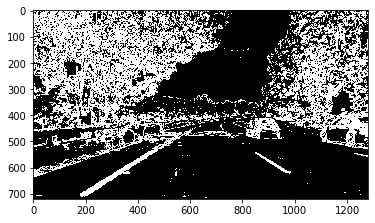

In [11]:
combined = combined_thresh(undistorted_images[6], sobel_kernel=3, abs_thresh=(20,255), _mag_thresh=(20,255), dir_thresh=(0, np.pi/2))

plt.imshow(combined, cmap='gray')

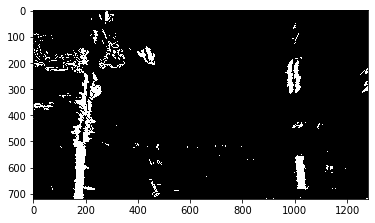

In [12]:
combined = combined_thresh(warped_images[6], sobel_kernel=3, abs_thresh=(20,255), _mag_thresh=(20,255), dir_thresh=(0, np.pi/2))

plt.imshow(combined, cmap='gray')

## 5. Lane Lines Detection

### Plotting Histogram with binary image

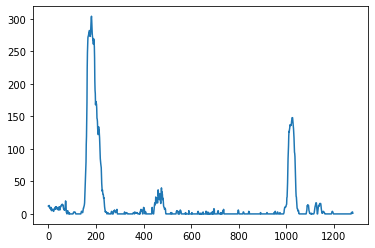

In [13]:
histogram = np.sum(combined[combined.shape[0]//2:,:], axis=0)
plt.plot(histogram)

### Implementing Sliding Windows and Fit a Polynomial

In [14]:
def sliding_window_polyfit(img):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    
    # Create an output image to draw on and  visualize the result
    out_img = np.uint8(np.dstack((img, img, img))*255)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(img.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, out_img

def visualize_polyfit(img, out_img, left_fit, right_fit, left_lane_inds, right_lane_inds):
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    plt.figure(figsize = (10,5))
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

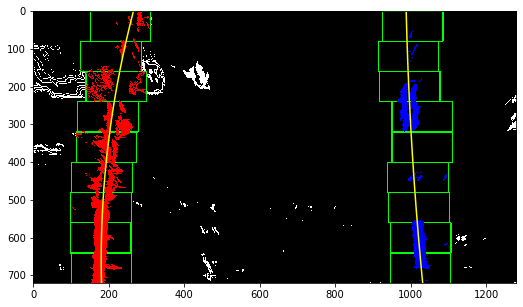

In [15]:
left_fit, right_fit, left_lane_inds, right_lane_inds, out_img = sliding_window_polyfit(combined)

visualize_polyfit(combined, out_img, left_fit, right_fit, left_lane_inds, right_lane_inds)

### Skip the sliding windows step once we know where the lines are

In [16]:
def skip_windows_step(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return out_img, left_fit, right_fit, left_lane_inds, right_lane_inds
    
def visualize_skip_window_step(binary_warped, out_img, left_fitx, right_fitx, left_lane_inds, right_lane_inds):
    margin = 80    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.uint8(np.dstack((binary_warped, binary_warped, binary_warped))*255)
    window_img = np.zeros_like(out_img)
    
    # Color in left and right line pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    plt.figure(figsize = (10,5))
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

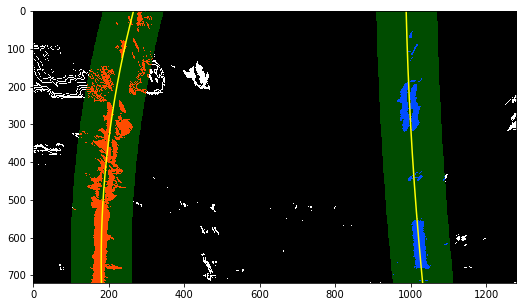

In [17]:
out_img, left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = skip_windows_step(combined, left_fit, right_fit)

visualize_skip_window_step(combined, out_img, left_fit2, right_fit2, left_lane_inds2, right_lane_inds2)

## 6. Curvature and Car Position Measurement

In [18]:
def measure_curvature(binary_warped, left_lane_inds, right_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    y_eval = np.max(ploty)
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

def measure_car_pos(binary_warped, left_fit, right_fit):
    xm_per_pix = 3.7/700
    car_position = binary_warped.shape[1]/2
    height = binary_warped.shape[0]
    
    left_fit_x = left_fit[0]*height**2 + left_fit[1]*height + left_fit[2]
    right_fit_x = right_fit[0]*height**2 + right_fit[1]*height + right_fit[2]
    
    lane_center_position = (right_fit_x + left_fit_x) /2
    
    center_dist = (car_position - lane_center_position) * xm_per_pix
    
    return center_dist

In [19]:
left_curverad, right_curverad = measure_curvature(combined, left_lane_inds2, right_lane_inds2)

print(left_curverad, 'm', right_curverad, 'm')

725.423967254643 m 1599.094802546548 m


In [20]:
car_pos = measure_car_pos(combined, left_fit2, right_fit2)

print(car_pos, 'm')

0.17081441547287285 m


## 7. Drawing Lane Lines in Original Image

In [21]:
def draw_lines(original_img, binary_img, left_fit, right_fit, Minv):
    ploty = np.linspace(0, binary_img.shape[0]-1, binary_img.shape[0])
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (original_img.shape[1], original_img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(original_img, 1, newwarp, 0.3, 0)
    
    return result

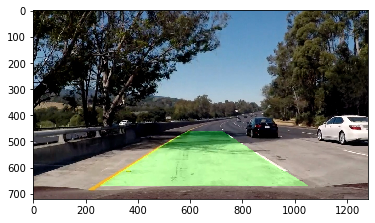

In [28]:
new_img = draw_lines(original_images[6], combined, left_fit, right_fit, Minvs[5])
plt.imshow(new_img)

### Drawing Curvature data

In [29]:
def draw_curvature_data(img, curv_rad, car_pos):
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:02.2f}'.format(curv_rad/1000) + 'Km'
    cv2.putText(img, text, (30,70), font, 1.5, (0,255,0), 2, cv2.LINE_AA)
    
    text = 'Car pos. from center: ' + '{:02.3f}'.format(car_pos) + 'm'
    cv2.putText(img, text, (30,120), font, 1.5, (0,255,0), 2, cv2.LINE_AA)
    
    return img

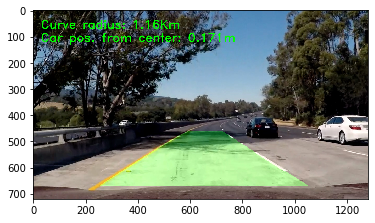

In [30]:
final_img = draw_curvature_data(new_img, (left_curverad + right_curverad)/2, car_pos)

plt.imshow(final_img)

## Processing Videos

### Line class definition

In [25]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False      
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
    def add_best_fit(self, lane_fit, lane_inds):
        if lane_fit is not None:
            if self.best_fit is not None:
                self.diffs = abs(lane_fit - self.best_fit)
            if (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.) and len(self.current_fit) > 0:
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(lane_inds)
                self.current_fit.append(lane_fit)
                if len(self.current_fit) > 5:
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = lane_fit
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
                self.best_fit = np.average(self.current_fit, axis=0)

### Defining Pipeline

In [26]:
def process_img(img):  
    original_img = np.copy(img)
    
    undist = cv2.undistort(original_img, mtx, dist, None, mtx)
    
    warped_image, M, Minv = warp_image(undist)
    
    binary_img = combined_thresh(warped_image)
    
    if not left_line.detected or not right_line.detected:
        left_fit, right_fit, left_lane_inds, right_lane_inds, out_img = sliding_window_polyfit(binary_img)
    else:
        out_img, left_fit, right_fit, left_lane_inds, right_lane_inds = skip_windows_step(binary_img, left_line.best_fit, right_line.best_fit)
    
    left_line.add_best_fit(left_fit, left_lane_inds)
    right_line.add_best_fit(right_fit, right_lane_inds)
        
    if left_line.best_fit is not None and right_line.best_fit is not None:
        new_img = draw_lines(original_img, binary_img, left_line.best_fit, right_line.best_fit, Minv)
        
        left_curverad, right_curverad = measure_curvature(binary_img, left_lane_inds, right_lane_inds)
        car_pos = measure_car_pos(binary_img, left_line.best_fit, right_line.best_fit)
        
        final_img = draw_curvature_data(new_img, (left_curverad + right_curverad)/2, car_pos)
    else:
        new_img = original_img
    
    return new_img

### Process Basic Video

In [27]:
left_line = Line()
right_line = Line()

video_output1 = 'project_video_output_final.mp4'
video_input1 = VideoFileClip('./project_video.mp4')
processed_video = video_input1.fl_image(process_img)
%time processed_video.write_videofile(video_output1, audio=False)

Moviepy - Building video project_video_output_final.mp4.
Moviepy - Writing video project_video_output_final.mp4



Moviepy - Done !
Moviepy - video ready project_video_output_final.mp4
Wall time: 4min 51s
